# Using the Goodman Pipeline in live reduction

We call _live_ reduction because is intended to happen very quickly after the image arrived at the instrument's computer.

# Process Overview

- Actions on files
  + Overscan Correction
  + Bias Subtraction
  + Trim according to `TRIMSEC`
  + Trim according to slit illuminated area
  + Combine master bias 
  + Combine master flats
  + Normalize master flat
  + Apply flat correction
  

- Build Calibrations  
  + Make master bias
  + Make master flats
 

Before start, some imports and definitions are necessary

In [29]:
import os
from ccdproc import CCDData
import matplotlib
matplotlib.rcParams['figure.figsize'] = [18, 10]
%matplotlib inline
import matplotlib.pyplot as plt
import re
import numpy as np


test_data = '/user/simon/data/soar/work/aeon/2019-08-06'

sample_file = '0175_OGLE-2019-BLG-1151-07-08-2019.fits'

full_path = os.path.join(test_data, sample_file)



For reading the files use `goodman_pipeline.core.read_fits`. It will add a set of keywords that ensure smooth operation of the pipeline.

(555.1281879182164, 823.6476269995969)


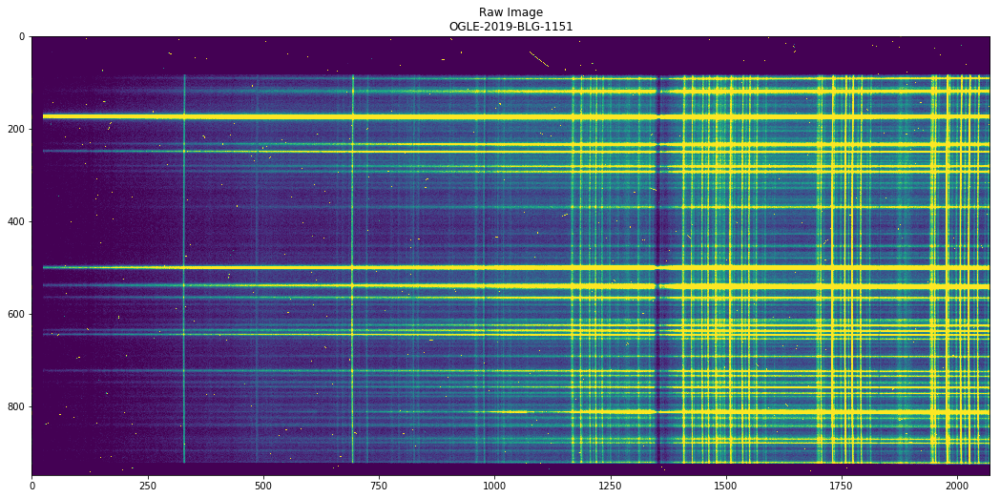

In [30]:
from goodman_pipeline.core import read_fits

ccd = read_fits(full_path=full_path, technique='Spectroscopy')

def show_image(ccd,  clim=None, title=""):
    
    if clim is None:
        z1 = np.mean(ccd.data) - 0.5 * np.std(ccd.data)
        z2 = np.median(ccd.data) + np.std(ccd.data)
        clim = (z1, z2)
        print(clim)
    fig, ax = plt.subplots(figsize=(18, 10))
    ax.imshow(ccd.data, cmap='viridis', clim=clim)
    ax.set_title(title)
    
show_image(ccd=ccd, title="Raw Image\n{}".format(ccd.header['OBJECT']))

In [31]:
print(ccd.header)

SIMPLE  =                    T / FITS Standard                                  BITPIX  =                   16 / FITS Bits/Pixel (-16 signifies [U16])          NAXIS   =                    2 / Number of Axes                                 NAXIS1  =                 2071 / Length of Axis 1 (Columns)                     NAXIS2  =                  948 / Length of Axis 2 (Rows)                        BSCALE  =                    1 / Scaling Factor (Default=1)                     BZERO   =                32768 / Offset Factor (Default=0)                      DATE-OBS= '2019-08-07T03:53:15.774' / DATE-OBS Format: YYYY-MM-DDThh:mm:ss.sss  DATE    = '2019-08-07'         / Date Format is YYYY-MM-DD                      TIME    = '03:53:15.774 to 04:08:15.780' / ~ Start & Stop of Exposure           N_PRM0  =                   59 / Status                                         PG0_0   =                24624 / Camera Flags,                                  PG0_1   =            23276.902 / Camera 

# Image Reduction

## Overscan

The overscan area is an area of the image that represents non-existing pixels. Literally, the camera keeps reading a bit longer after all the real pixels have been read and they are added to the file like if they were real. Overscan is used to trace the level of bias signal. (bias files do this and also trace the 2D structure of the bias signal).

There is a function as well to determine the overscan region. Imaging data does not have overscan area thus only bias files can be used.

In [32]:
from goodman_pipeline.core import get_overscan_region

overscan_region = get_overscan_region(sample_image=full_path, technique='Spectroscopy')
print(overscan_region)

[12:52:51][I]: Overscan regions has been tested for ROI Spectroscopic 1x1, 2x2 and 3x3
[12:52:51][I]: Overscan Region: [3:24,1:948]


[3:24,1:948]


(58.89254193315077, 327.63579660685906)


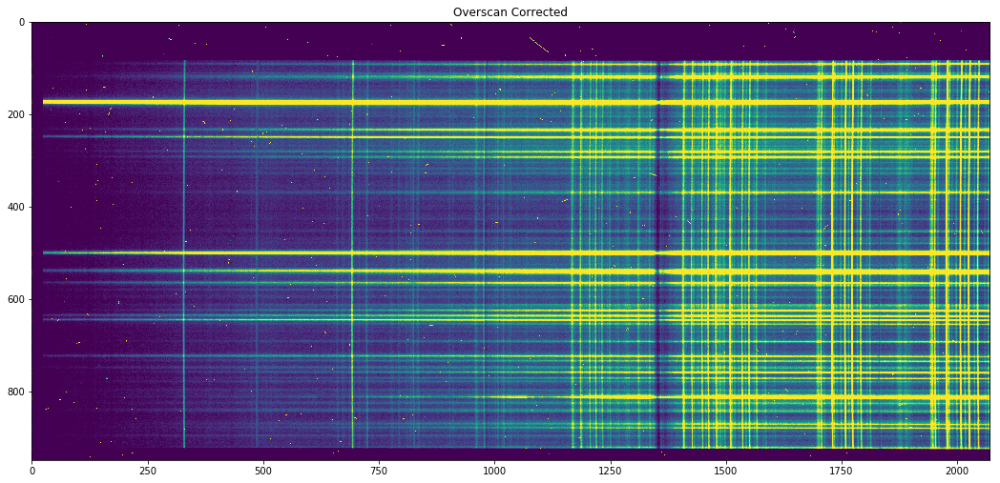

In [33]:
from goodman_pipeline.core import image_overscan

ccd = image_overscan(ccd=ccd,overscan_region=overscan_region)

show_image(ccd=ccd, title='Overscan Corrected')


## Trimming

Trim section is the area useful of the image. For spectroscopy is a bit tricky and for Imaging is straightforward from the header under the keyword `TRIMSEC`. However there is a function that can be easily imported.


In order to determine trimming area **the full path** to an image is needed and the observing technique.

In [34]:
from goodman_pipeline.core import define_trim_section

trim_section = define_trim_section(os.path.join(test_data, sample_file), technique='Spectroscopy')
print(trim_section)

[12:52:55][W]: Determining trim section. Assuming you have only one kind of data in this folder
[12:52:55][I]: Trim Section: [26:2055,2:948]


[26:2055,2:948]


(60.32489431072857, 328.23040238878525)


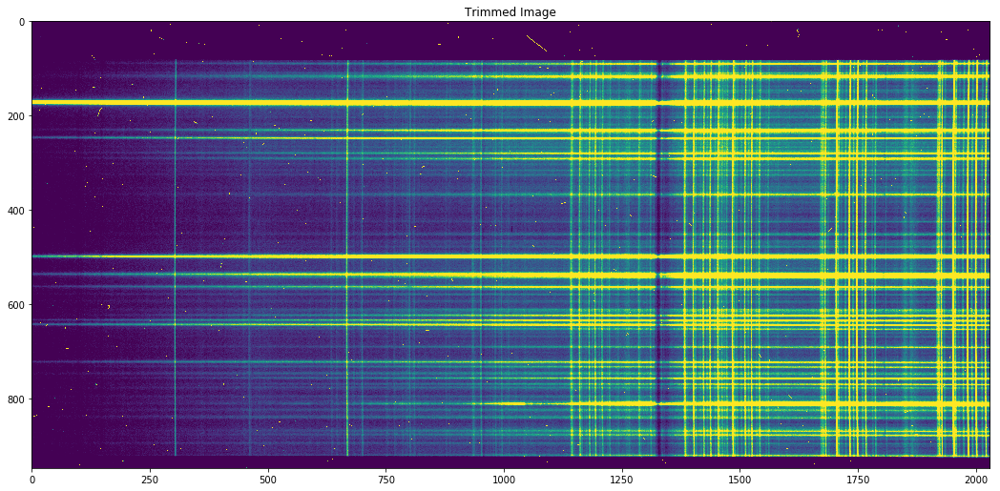

In [35]:
from goodman_pipeline.core import image_trim

ccd = image_trim(ccd=ccd, trim_section=trim_section)

show_image(ccd=ccd, title="Trimmed Image")

**The trimmed section is more noticeable to the left in the image above**

For reference below the area used is the area enclosed in the four red lines, whose thickness was exagerated.

26 2055 2 948
[26:2055,2:948]


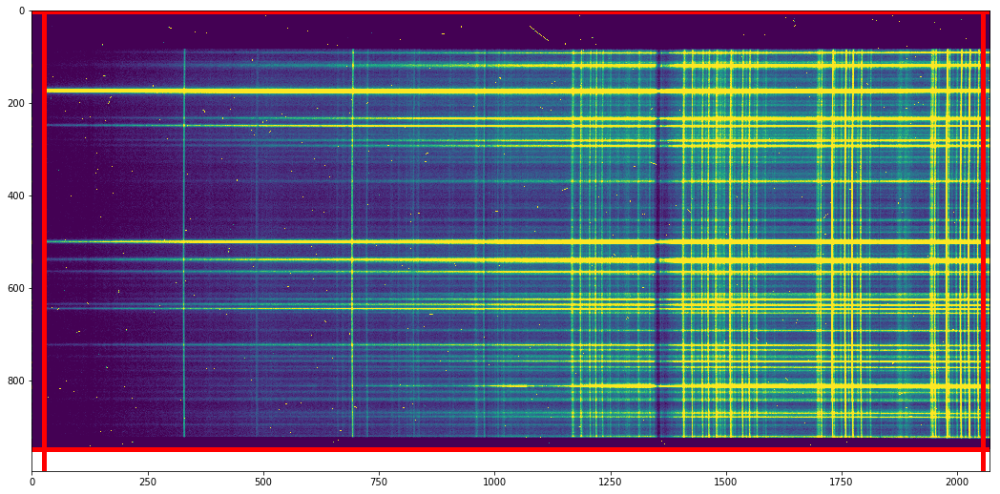

In [36]:

raw_ccd = CCDData.read(full_path, unit='adu')

fig, ax = plt.subplots(figsize=(18, 10))
ax.imshow(raw_ccd.data, cmap='viridis', clim=(555.1281879182164, 823.6476269995969))
section_x, section_y = re.sub('[\[\]]', '', trim_section).split(',')
x1, x2 = section_x.split(':')
y1, y2 = section_y.split(':')
print(int(x1), int(x2), int(y1), int(y2))
ax.axhline(y=int(y1), color='r', linewidth=5.0)
ax.axhline(y=int(y2), color='r', linewidth=5.0)
ax.axvline(x=int(x1), color='r', linewidth=5.0)
ax.axvline(x=int(x2), color='r', linewidth=5.0)
# ax.axvspan(xmin=int(x1), xmax=int(x2), color='r')
print(trim_section)


## Bias Correction

We need a list of bias files, the path to the data, were it should be stored, observing technique, overscan and trim section.

### Create Master Bias

In [41]:
from goodman_pipeline.core import create_master_bias

reduced_data_path = os.path.join(test_data, 'RED2')

bias_files_list = ["0083_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0084_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0085_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0086_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0087_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0088_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0089_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0090_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0091_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0092_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0093_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0094_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0095_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0096_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0097_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0098_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0099_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0100_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0101_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0102_BIAS_344ATTN3_SP_2x2-06-08-2019.fits",
                   "0103_BIAS_344ATTN3_SP_2x2-06-08-2019.fits"]

master_bias, master_bias_name = create_master_bias(bias_files=bias_files_list, 
                                                   raw_data=test_data, 
                                                   reduced_data=reduced_data_path, 
                                                   technique='Spectroscopy', 
                                                   overscan_region=overscan_region, 
                                                   trim_section=trim_section)

[12:53:18][I]: New name for master bias: /user/simon/data/soar/work/aeon/2019-08-06/RED2/master_bias_4.fits
[12:53:19][I]: Creating master bias
[12:53:28][I]: Saving FITS file to master_bias_4.fits
[12:53:28][I]: Created master bias: /user/simon/data/soar/work/aeon/2019-08-06/RED2/master_bias_4.fits


Master bias file is: /user/simon/data/soar/work/aeon/2019-08-06/RED2/master_bias_4.fits
(0.01942172114704449, 0.5955373609684825)


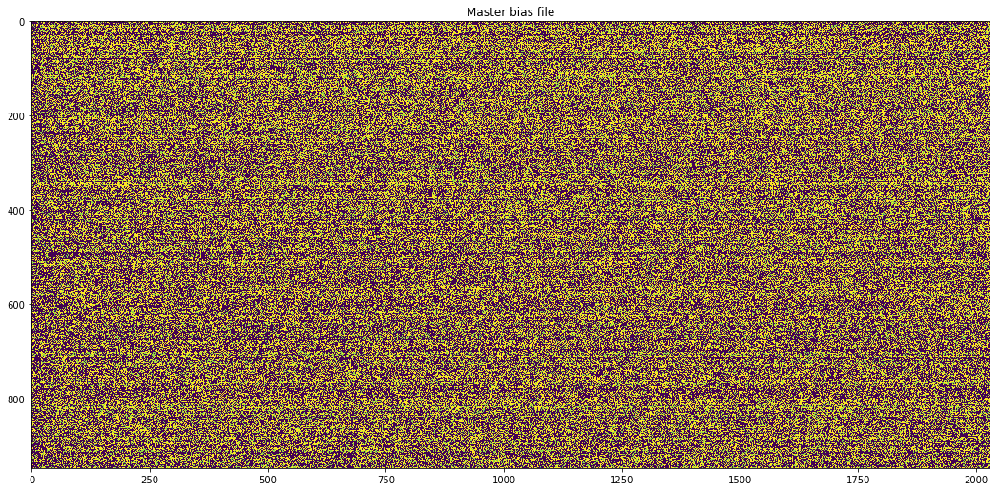

In [42]:
print("Master bias file is: {}".format(master_bias_name))
show_image(ccd=master_bias, title="Master bias file")

### Apply bias correction

In order to apply the correction just import ccdproc and use `subtract_bias`

(59.69011059747376, 328.23120820876966)


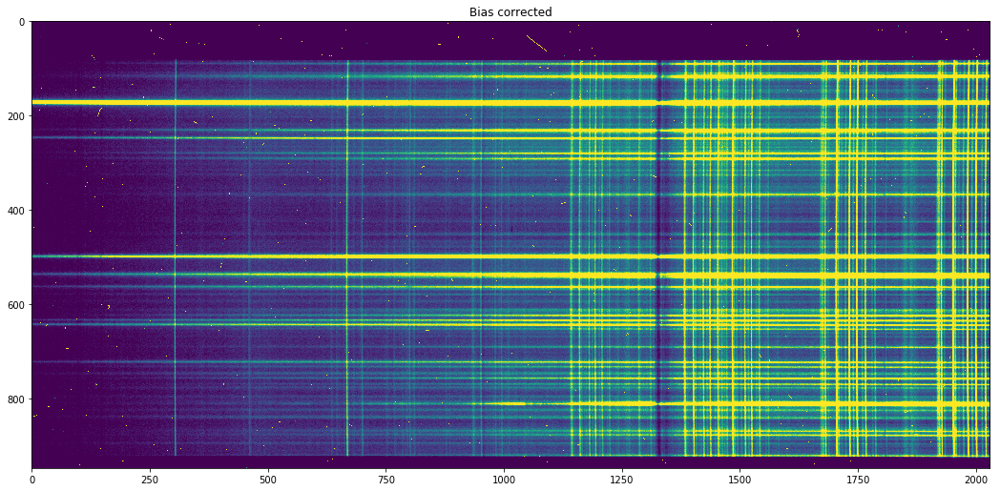

In [43]:
import ccdproc

ccd = ccdproc.subtract_bias(ccd=ccd, master=master_bias, add_keyword=False)
show_image(ccd=ccd, title='Bias corrected')

## Flat Correction

### Create master flats

For creating the master flats we need the saturation values for a given configuration. This is to discard saturated flats. This is critical otherwise the results are invalid.

In [44]:
from goodman_pipeline.core import SaturationValues
saturation_values = SaturationValues(ccd=ccd)

saturation_value = saturation_values.saturation_value

print("This readout mode saturates at: {}".format(saturation_value))

This readout mode saturates at: 69257.0


In [45]:
from goodman_pipeline.core import create_master_flats

# flat_files = ['0163_OGLE-2019-BLG-1151-07-08-2019.fits', 
#               '0167_OGLE-2019-BLG-1151-07-08-2019.fits', 
#               '0173_OGLE-2019-BLG-1151-07-08-2019.fits',
#               '0177_OGLE-2019-BLG-1151-07-08-2019.fits']

flat_files = ["0022_DFLAT-06-08-2019.fits",
              "0023_DFLAT-06-08-2019.fits",
              "0024_DFLAT-06-08-2019.fits",
              "0025_DFLAT-06-08-2019.fits",
              "0026_DFLAT-06-08-2019.fits",
              "0027_DFLAT-06-08-2019.fits",
              "0028_DFLAT-06-08-2019.fits",
              "0029_DFLAT-06-08-2019.fits",
              "0030_DFLAT-06-08-2019.fits",
              "0031_DFLAT-06-08-2019.fits",
              "0032_DFLAT-06-08-2019.fits",
              "0033_DFLAT-06-08-2019.fits",
              "0034_DFLAT-06-08-2019.fits",
              "0035_DFLAT-06-08-2019.fits",
              "0036_DFLAT-06-08-2019.fits",
              "0037_DFLAT-06-08-2019.fits",
              "0038_DFLAT-06-08-2019.fits",
              "0039_DFLAT-06-08-2019.fits",
              "0040_DFLAT-06-08-2019.fits",
              "0041_DFLAT-06-08-2019.fits",
              "0042_DFLAT-06-08-2019.fits"]

new_master_flat_name = 'master_flat_400_M2.fits'

master_flat, master_flat_name = create_master_flats(flat_files=flat_files, 
                                                    raw_data=test_data, 
                                                    reduced_data=reduced_data_path, 
                                                    technique='Spectroscopy',
                                                    overscan_region=overscan_region, 
                                                    trim_section=trim_section,
                                                    master_bias_name=master_bias_name, 
                                                    new_master_flat_name=new_master_flat_name,
                                                    saturation=saturation_value, 
                                                    ignore_bias=False)



[12:53:44][I]: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.
[12:53:44][I]: Creating Master Flat


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


[12:53:53][I]: Saving FITS file to master_flat_400_M2.fits
[12:53:53][I]: Created Master Flat: /user/simon/data/soar/work/aeon/2019-08-06/RED2/master_flat_400_M2.fits


(11967.447376357504, 29079.750630163777)


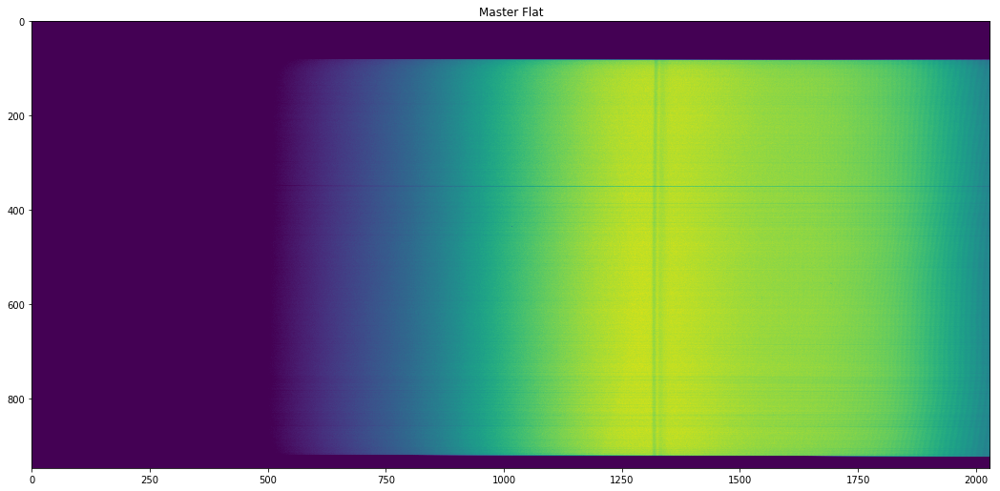

In [46]:
show_image(ccd=master_flat, title="Master Flat")

Now is a good time to find the slit trim section

### Find Slit Trim

This should be obtained using a master flat because the clear contrast between the slit illuminated area vs the non-illuminated.

In [47]:
from goodman_pipeline.core import get_slit_trim_section

slit_trim_section = get_slit_trim_section(master_flat=master_flat)
print(slit_trim_section)

[1:2030,92:910]


### Apply Slit Trim

Applying slit trim reuses the function `image_trim` previously imported just changing the parameter `trim_type` to `slit`

(73.85207299587806, 344.1594910280386)


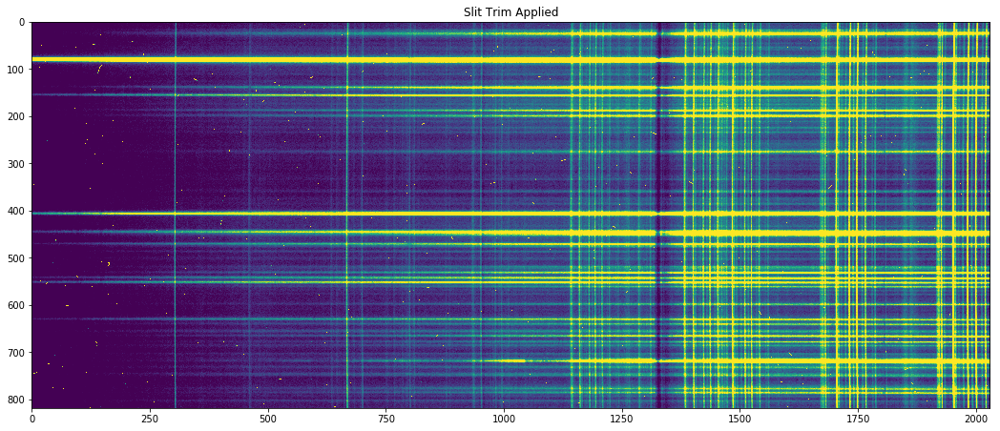

In [48]:
ccd = image_trim(ccd=ccd, trim_section=slit_trim_section, trim_type='slit')

show_image(ccd=ccd, title="Slit Trim Applied")

### Apply master flat correction

First apply slit trim to master

(14729.123201190825, 29578.20622427467)


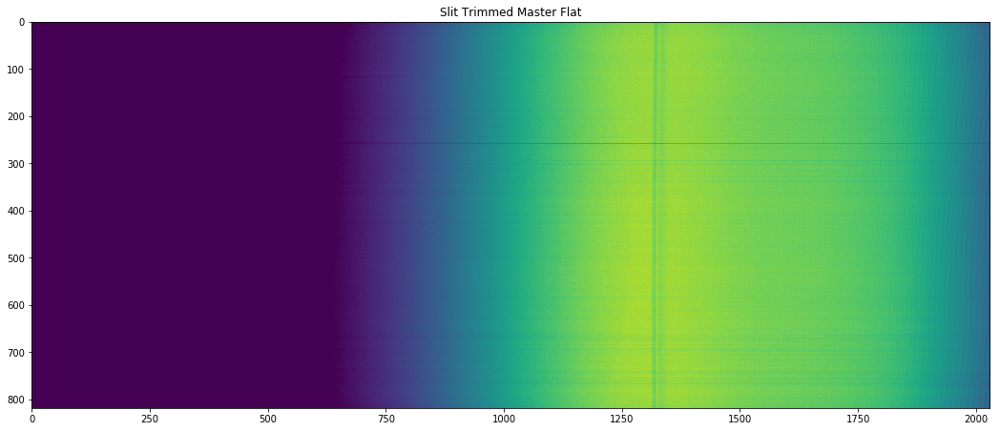

In [49]:
slit_trimmed_master_flat = image_trim(ccd=master_flat, trim_section=slit_trim_section, trim_type='slit')

show_image(ccd=slit_trimmed_master_flat, title='Slit Trimmed Master Flat')

Normalize master flat

[12:54:10][I]: Saving FITS file to norm_master_flat_400_M2.fits


Normalized flat name: /user/simon/data/soar/work/aeon/2019-08-06/RED2/norm_master_flat_400_M2.fits
(0.9937123374238345, 1.010847071010988)


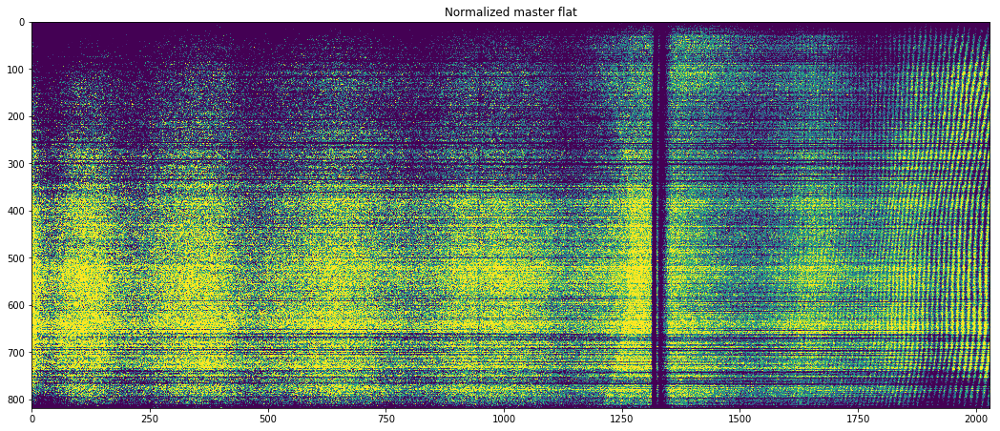

In [50]:
from goodman_pipeline.core import normalize_master_flat
normalized_flat, normalized_master_flat_name = normalize_master_flat(master=slit_trimmed_master_flat, 
                                                                     name=master_flat_name, 
                                                                     method='simple') 

print("Normalized flat name: {}".format(normalized_master_flat_name))
show_image(ccd=normalized_flat, title='Normalized master flat')

In [51]:
print(ccd.data.shape, normalized_flat.data.shape)

(819, 2030) (819, 2030)


In [53]:
for key in ccd.header.keys():
    print("{}  = {}".format(key, ccd.header[key]))

SIMPLE  = True
BITPIX  = 16
NAXIS  = 2
NAXIS1  = 2071
NAXIS2  = 948
BSCALE  = 1
BZERO  = 32768
DATE-OBS  = 2019-08-07T03:53:15.774
DATE  = 2019-08-07
TIME  = 03:53:15.774 to 04:08:15.780
N_PRM0  = 59
PG0_0  = 24624
PG0_1  = 23276.902
PG0_2  = 0
PG0_3  = 2.238
PG0_4  = 2.238
PG0_5  = 5.25
PG0_6  = 0.0
PG0_7  = 19071
PG0_8  = 43
PG0_9  = 257
PG0_10  = 31.5
PG0_11  = 39
PG0_12  = 40
PG0_13  = 40
PG0_14  = 41
PG0_15  = 37.5
PG0_16  = 3.289
PG0_17  = 11.972
PG0_18  = 11.766
PG0_19  = 24.003
PG0_20  = 49.761
PG0_21  = -13.173
PG0_22  = -6.624
PG0_23  = 6.667
PG0_24  = 5.722
PG0_25  = 13.426
PG0_26  = 24.805
PG0_27  = 31.515
PG0_28  = 2147483647
PG0_29  = 10.176
PG0_30  = 0.002
PG0_31  = 12.046
PG0_32  = 0.018
PG0_33  = 29.52
PG0_34  = 17.011
PG0_35  = 2.262
PG0_36  = 0.988
PG0_37  = -13.085
PG0_38  = -6.307
PG0_39  = -4.872
PG0_40  = 1.212
PG0_41  = 3.279
PG0_42  = 3.29
PG0_43  = 5.186
PG0_44  = 5.029
PG0_45  = 6.165
PG0_46  = 13.361
PG0_47  = 24.013
PG0_48  = 31.507
PG0_49  = 0.0
PG0_50  = 

(73.56153994528417, 344.97835244298153)


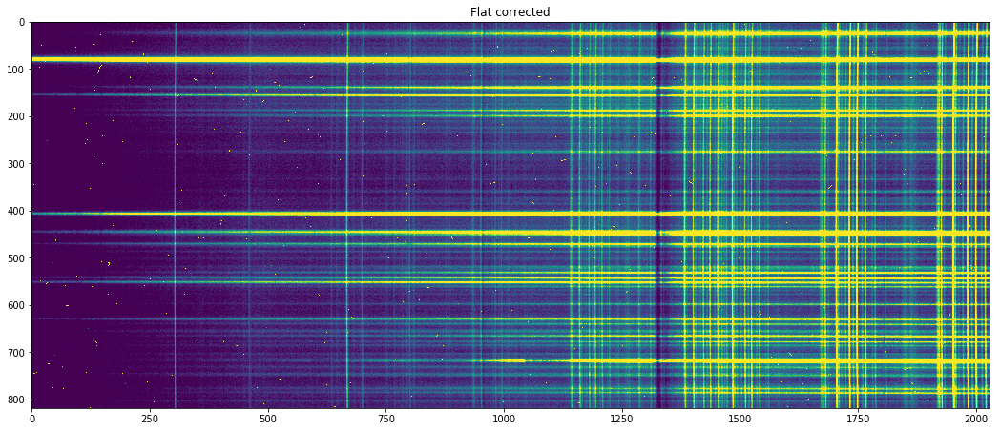

In [54]:
ccd = ccdproc.flat_correct(ccd=ccd, flat=normalized_flat, add_keyword=False)

show_image(ccd=ccd, title='Flat corrected')

## Cosmic Ray Rejection

In [55]:
from goodman_pipeline.core import call_cosmic_rejection
ccd, prefix = call_cosmic_rejection(ccd=ccd,
                                    image_name=sample_file,
                                    out_prefix='c', 
                                    red_path=reduced_data_path, dcr_par=full_path,method='default')

[12:54:33][I]: Setting cosmic ray rejection method to: lacosmic
[12:54:34][I]: Cosmic rays rejected using astroscrappy's lacosmic


(86.45478057861328, 315.61627)


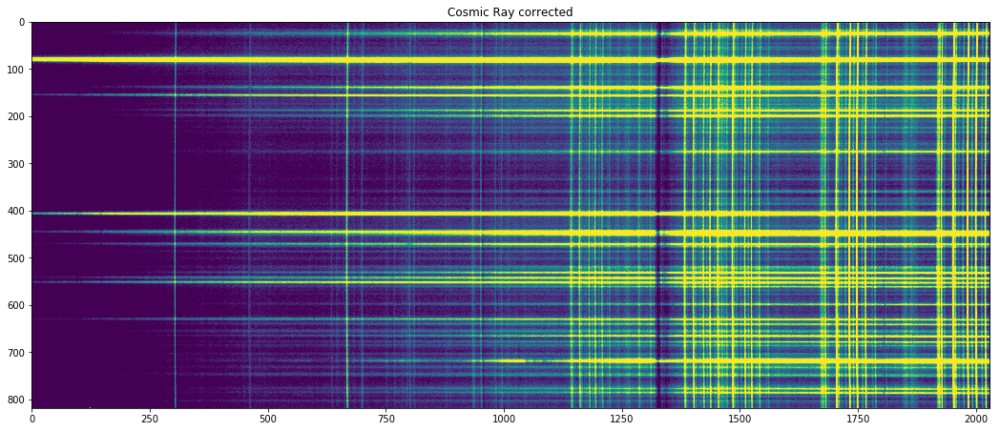

In [56]:
show_image(ccd=ccd, title="Cosmic Ray corrected")

# Spectroscopic Id and Extraction

## Identify Targets

[12:54:43][I]: Searching spectroscopic targets in file: 0175_OGLE-2019-BLG-1151-07-08-2019.fits
[12:54:43][I]: Fitting Linear1D model to spatial profile to detect background shape
[12:54:44][I]: Subtracting background shape and level spatial profile for better target identification
[12:54:44][I]: Finding all peaks in spatial profile
[12:54:44][I]: Selecting the 30 most intense peaks out of 21 found
[12:54:44][I]: Validating peaks by setting threshold 1 times the background level 124.83
[12:54:44][I]: Selecting peak: Centered: 82.0 Intensity 2227.192
[12:54:44][I]: Selecting peak: Centered: 407.0 Intensity 814.914
[12:54:44][I]: Selecting peak: Centered: 140.0 Intensity 350.487
[12:54:44][I]: Selecting peak: Centered: 446.0 Intensity 342.768
[12:54:44][I]: Selecting peak: Centered: 157.0 Intensity 311.852
[12:54:44][I]: Selecting peak: Centered: 552.0 Intensity 251.119
[12:54:44][I]: Selecting peak: Centered: 472.0 Intensity 209.054
[12:54:44][I]: Selecting peak: Centered: 543.0 Intensi

[<Gaussian1D(amplitude=2136.54605198, mean=82.03477516, stddev=2.00028372, name='Gaussian_82')>, <Gaussian1D(amplitude=807.52238925, mean=407.32084902, stddev=2.24440192, name='Gaussian_407')>, <Gaussian1D(amplitude=325.80290953, mean=140.50624252, stddev=2.3062165, name='Gaussian_140')>, <Gaussian1D(amplitude=306.65174676, mean=446.6404857, stddev=3.77377298, name='Gaussian_446')>, <Gaussian1D(amplitude=305.01605183, mean=157.16100424, stddev=1.76221267, name='Gaussian_157')>, <Gaussian1D(amplitude=184.08977368, mean=472.39123628, stddev=2.55016291, name='Gaussian_472')>, <Gaussian1D(amplitude=184.95128124, mean=718.78240099, stddev=2.2167685, name='Gaussian_719')>, <Gaussian1D(amplitude=177.28327989, mean=26.34123164, stddev=3.61840197, name='Gaussian_27')>, <Gaussian1D(amplitude=169.27041359, mean=188.40631715, stddev=2.2991887, name='Gaussian_188')>, <Gaussian1D(amplitude=168.34741542, mean=531.56506203, stddev=1.97693329, name='Gaussian_532')>, <Gaussian1D(amplitude=163.94064903, 

[12:54:44][I]: Identified 13 targets


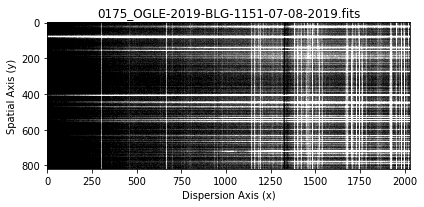

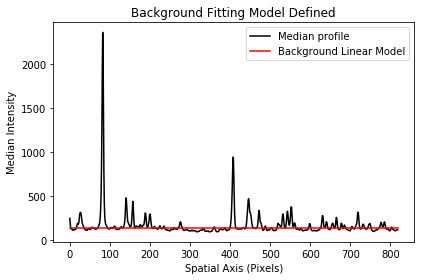

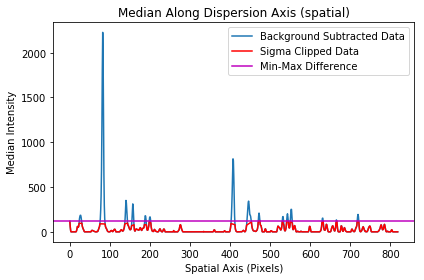

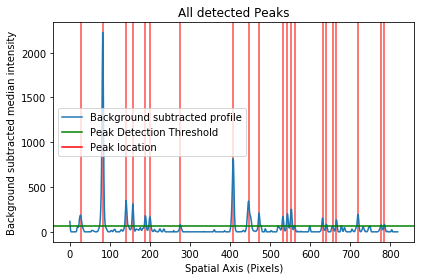

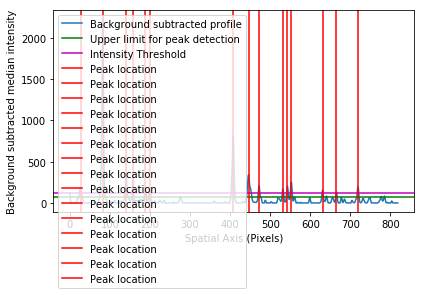

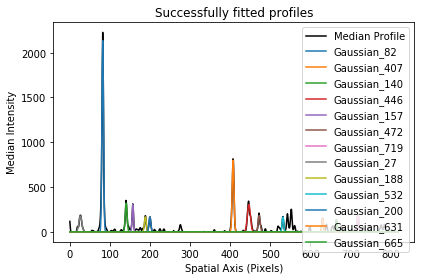

In [57]:
from goodman_pipeline.core import identify_targets

target_list = identify_targets(ccd=ccd, fit_model='gaussian', background_threshold=1, nfind=30, plots=True)

## Trace Targets

[12:58:32][I]: Target tracing RMS error: 0.186
[12:58:33][I]: Target tracing RMS error: 0.152
[12:58:33][I]: Target tracing RMS error: 0.228
[12:58:33][I]: Target tracing RMS error: 0.300
[12:58:33][I]: Target tracing RMS error: 0.189
[12:58:34][I]: Target tracing RMS error: 0.233
[12:58:34][I]: Target tracing RMS error: 0.459
[12:58:34][I]: Target tracing RMS error: 0.465
[12:58:35][I]: Target tracing RMS error: 0.300
[12:58:35][I]: Target tracing RMS error: 0.945
[12:58:35][I]: Target tracing RMS error: 2.269
[12:58:35][I]: Target tracing RMS error: 0.253
[12:58:36][I]: Target tracing RMS error: 0.342


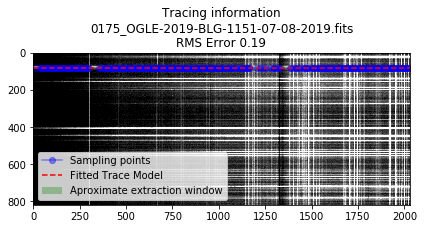

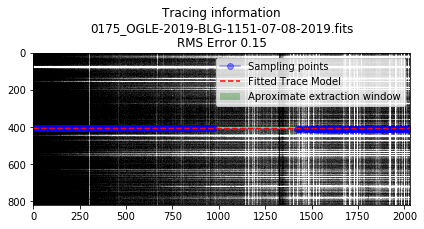

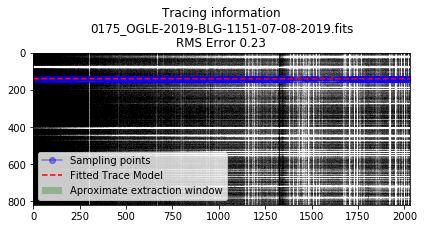

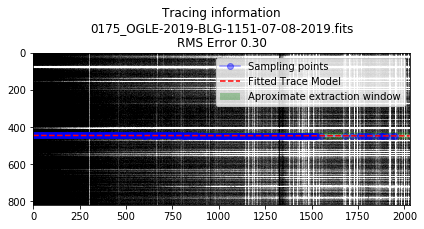

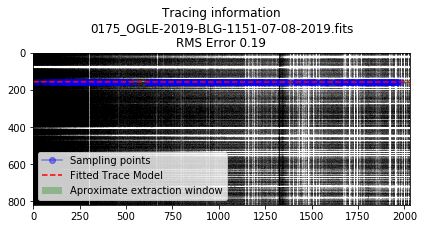

...

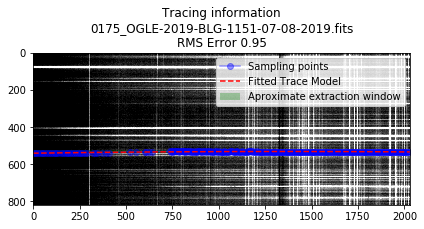

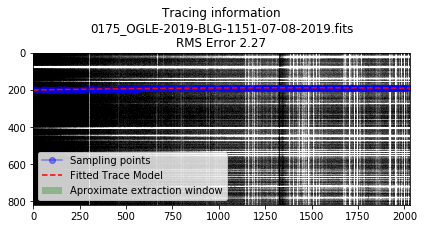

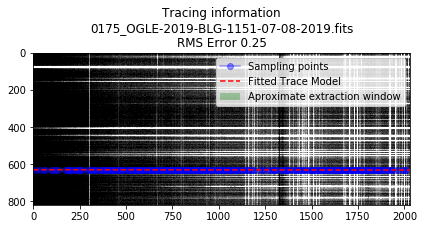

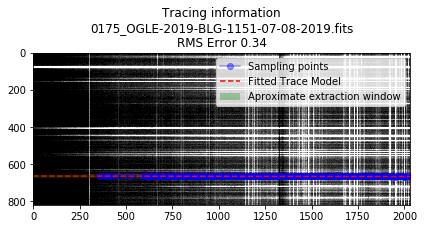

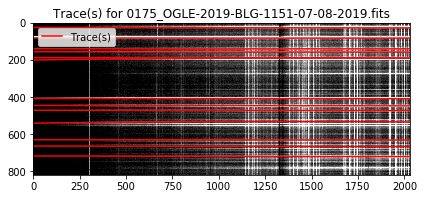

In [59]:
from goodman_pipeline.core import trace_targets

all_traces = trace_targets(ccd=ccd, target_list=target_list, nfwhm=2, plots=True)


## Extraction

For extracting targets we need to loop through 

In [63]:
def draw_spectrum(ccd, title=''):
    fig, ax = plt.subplots(figsize=(18,10))
    ax.plot(ccd.data)
    ax.set_title(title)

In [66]:
from goodman_pipeline.core import record_trace_information, extraction
all_extracted = []
for single_trace, single_profile, trace_info in all_traces:
    ccd = record_trace_information(ccd=ccd, trace_info=trace_info)
    
    extracted = extraction(ccd=ccd, 
                           target_trace=single_trace, 
                           spatial_profile=single_profile, 
                           extraction_name='fractional')
    all_extracted.append(extracted)

    

[16:01:24][I]: Fractional Pixel Extraction for 0175_OGLE-2019-BLG-1151-07-08-2019.fits
[16:01:24][I]: Extraction aperture in first column: 76.22:85.64
[16:01:24][I]: Background extraction zone 1: 52.67:62.09 column 1
[16:01:24][I]: Background extraction zone 2: 99.77:109.19 column 1
[16:01:24][I]: Fractional Pixel Extraction for 0175_OGLE-2019-BLG-1151-07-08-2019.fits
[16:01:24][I]: Extraction aperture in first column: 401.65:412.22
[16:01:24][I]: Background extraction zone 1: 375.23:385.80 column 1
[16:01:24][I]: Background extraction zone 2: 428.08:438.65 column 1
[16:01:24][I]: Fractional Pixel Extraction for 0175_OGLE-2019-BLG-1151-07-08-2019.fits
[16:01:24][I]: Extraction aperture in first column: 133.30:144.16
[16:01:24][I]: Background extraction zone 1: 106.15:117.01 column 1
[16:01:24][I]: Background extraction zone 2: 160.45:171.32 column 1
[16:01:24][I]: Fractional Pixel Extraction for 0175_OGLE-2019-BLG-1151-07-08-2019.fits
[16:01:24][I]: Extraction aperture in first column:

Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zo

[16:01:26][I]: Background extraction zone 1: 'none'
[16:01:26][I]: Background extraction zone 2: 59.20:76.24 column 1
[16:01:26][I]: Fractional Pixel Extraction for 0175_OGLE-2019-BLG-1151-07-08-2019.fits
[16:01:26][I]: Extraction aperture in first column: 181.46:192.29


Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zone 1
Invalid Zo

[16:01:26][I]: Background extraction zone 1: 154.39:165.22 column 1
[16:01:26][I]: Background extraction zone 2: 208.53:219.36 column 1
[16:01:26][I]: Fractional Pixel Extraction for 0175_OGLE-2019-BLG-1151-07-08-2019.fits
[16:01:26][I]: Extraction aperture in first column: 535.69:545.00
[16:01:26][I]: Background extraction zone 1: 512.41:521.72 column 1
[16:01:26][I]: Background extraction zone 2: 558.97:568.28 column 1
[16:01:26][I]: Fractional Pixel Extraction for 0175_OGLE-2019-BLG-1151-07-08-2019.fits
[16:01:26][I]: Extraction aperture in first column: 194.54:205.28
[16:01:26][I]: Background extraction zone 1: 167.70:178.44 column 1
[16:01:26][I]: Background extraction zone 2: 221.38:232.12 column 1
[16:01:26][I]: Fractional Pixel Extraction for 0175_OGLE-2019-BLG-1151-07-08-2019.fits
[16:01:26][I]: Extraction aperture in first column: 624.99:634.04
[16:01:26][I]: Background extraction zone 1: 602.36:611.41 column 1
[16:01:26][I]: Background extraction zone 2: 647.61:656.66 column

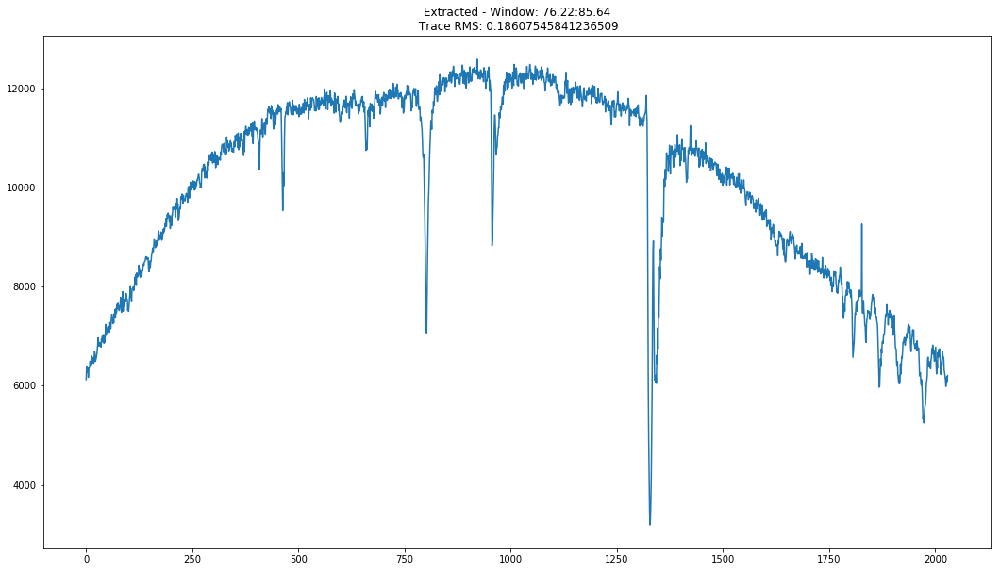

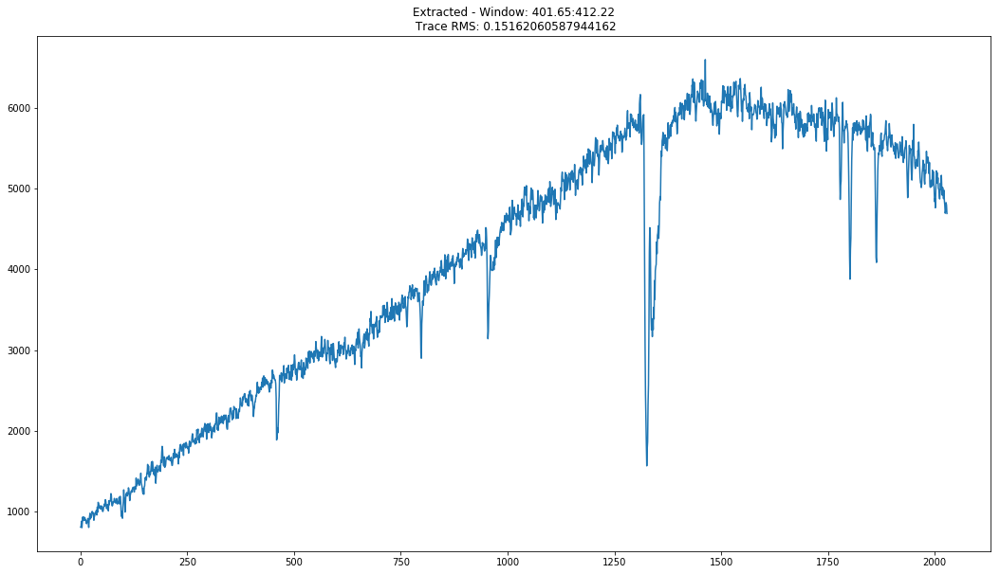

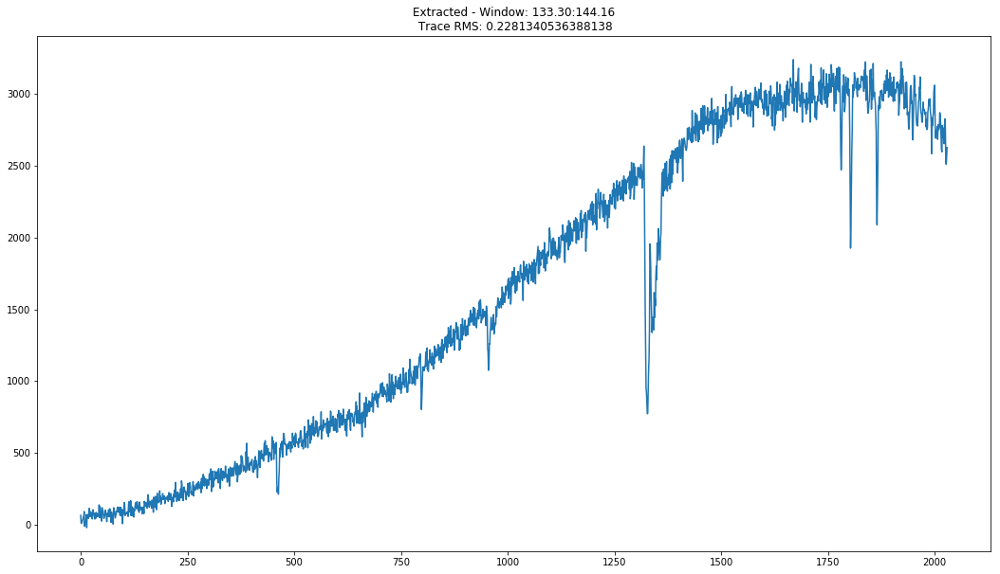

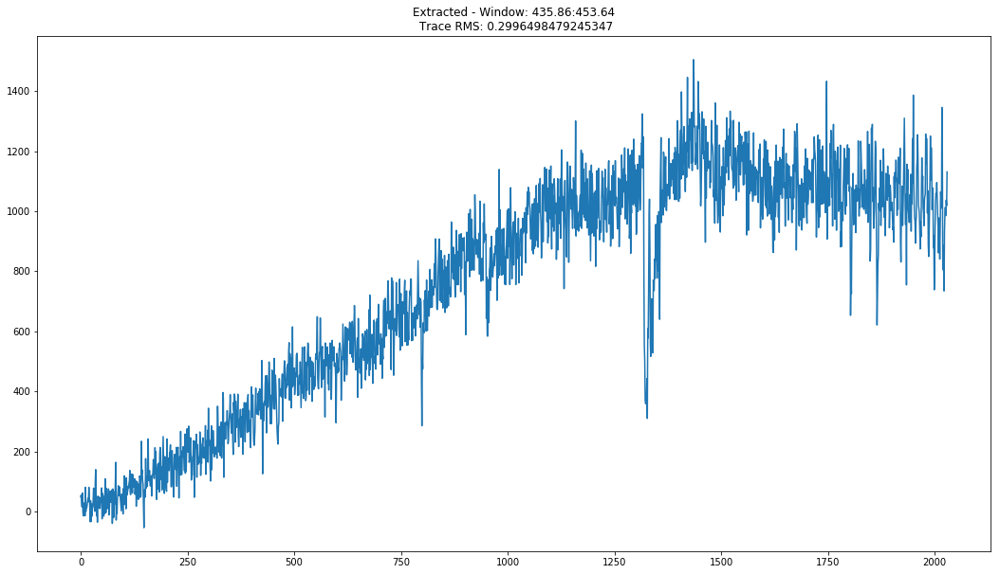

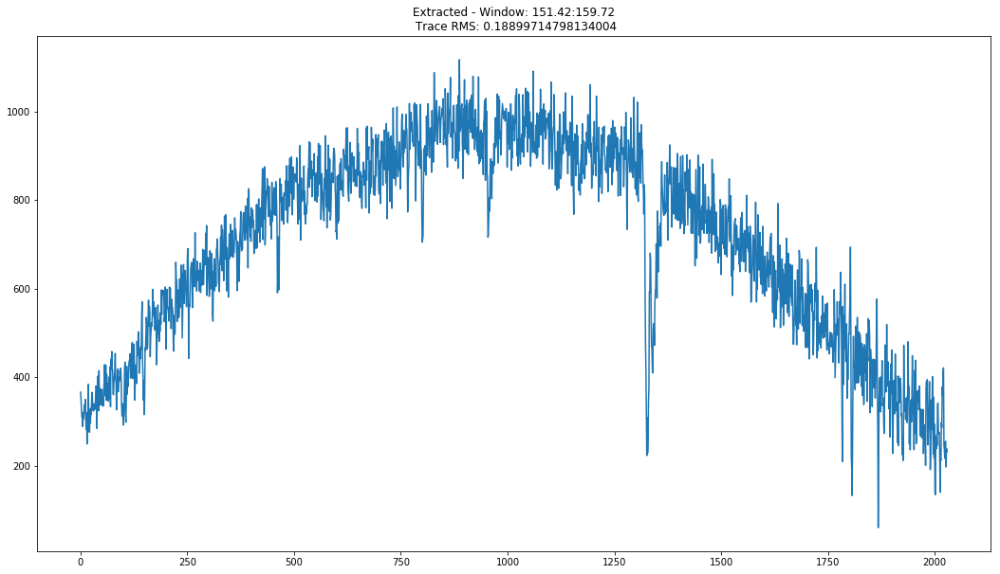

...

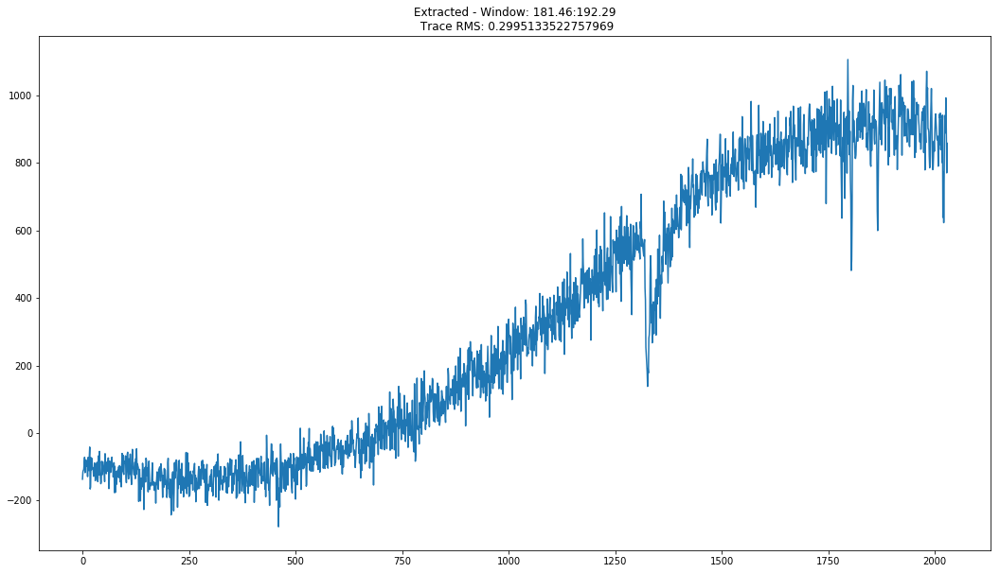

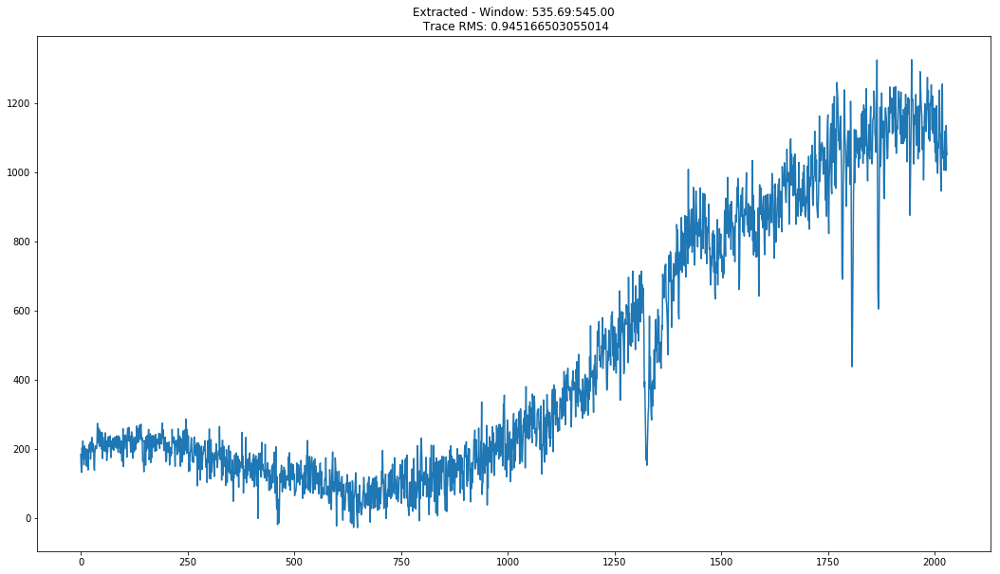

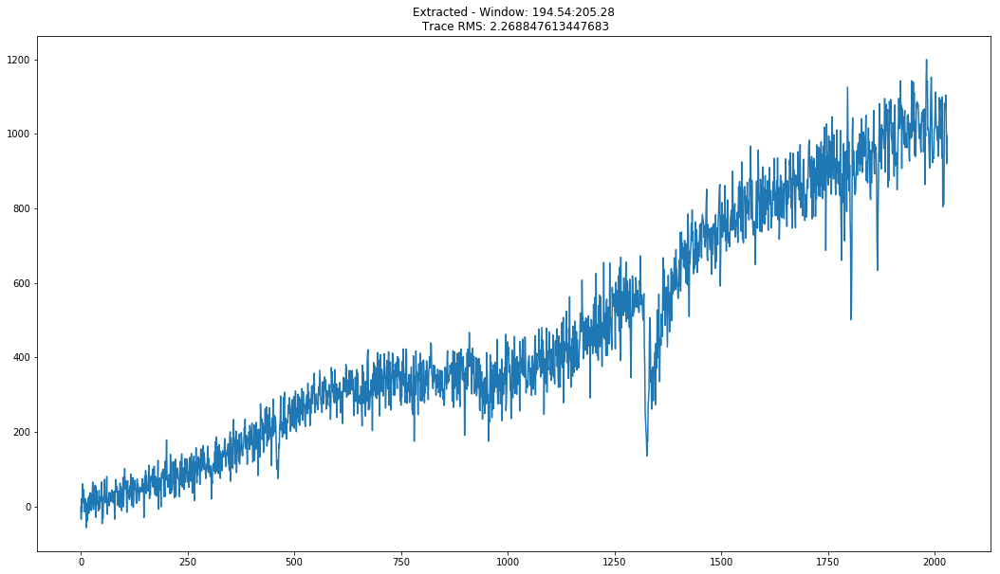

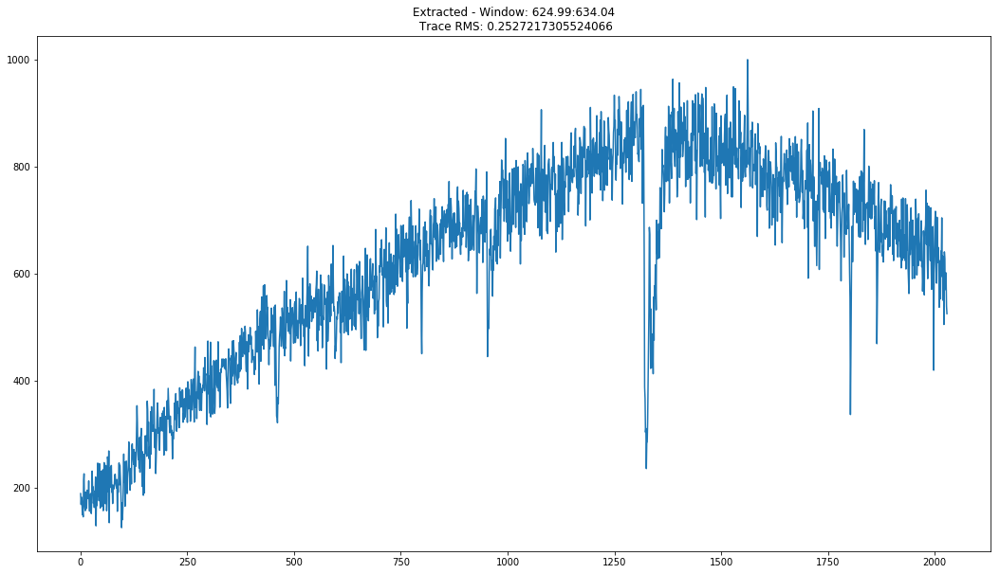

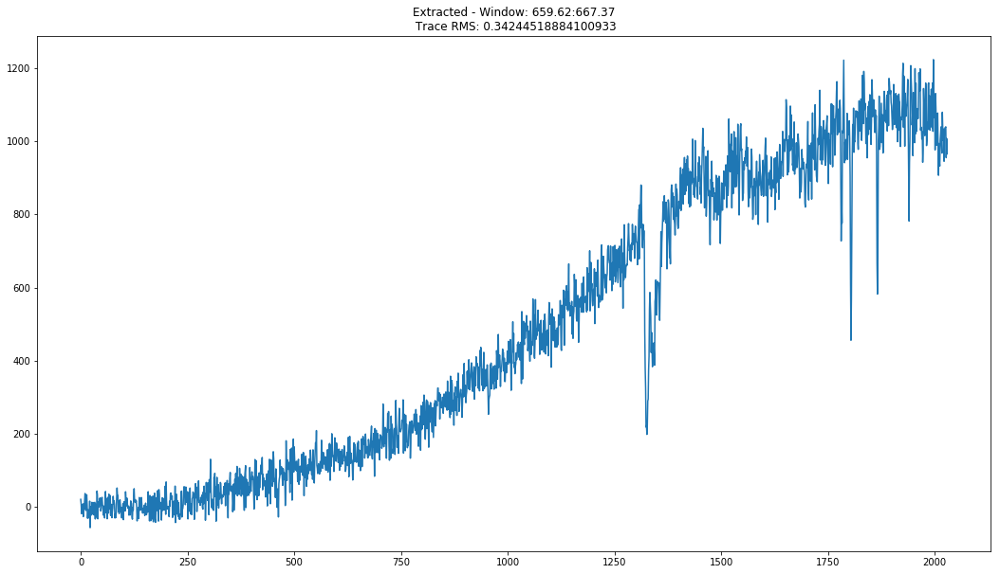

In [71]:
for extracted in all_extracted:
    draw_spectrum(ccd=extracted, title="Extracted - Window: {}\n Trace RMS: {}".format(extracted.header['GSP_EXTR'], extracted.header['GSP_TERR']))